In [1]:
%matplotlib inline

import os
import warnings
import numpy as np

from matplotlib import pyplot as plt

import seaborn as sb

from IPython.display import Image, display
from PIL import ImageFile

import tensorflow as tf
from keras.applications.inception_v3 import preprocess_input, decode_predictions
from keras import activations
from keras.preprocessing.image import load_img, img_to_array
from keras.models import load_model
from vis.utils import utils
from vis.visualization import visualize_saliency, overlay
from keras.preprocessing.image import ImageDataGenerator

import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, Imputer, OneHotEncoder

from connoisseur.models import build_model

ImageFile.LOAD_TRUNCATED_IMAGES = True

warnings.filterwarnings('ignore')

/mnt/files/envs/tf/lib/python3.6/site-packages/pydot.py:18: UserWarning: Couldn't import dot_parser, loading of dot files will not be possible.
  "Couldn't import dot_parser, "
Using TensorFlow backend.


## Standard Model Analysis

In [2]:
data_dir = "/datasets/pbn/"
batch_size = 64
image_shape = [299, 299, 3]
dataset_train_seed = 12
dataset_valid_seed = 98
train_shuffle = True
valid_shuffle = False
train_info = '/datasets/pbn/train_info.csv'
classes = None

architecture = 'InceptionV3'
weights = 'imagenet'
last_base_layer = None
use_gram_matrix = False
dense_layers = ()
pooling = 'avg'
num_classes = 1763

device = "/gpu:0"
resuming_from = '/work/painter-by-numbers/ckpt/inception_multilabel-1763-val_loss:0.1944_val_acc:0.9233.hdf5'
activation='sigmoid'

k = 5

In [3]:
def load_labels(train_info_path):
    info = pd.read_csv(train_info_path, quotechar='"', delimiter=',')
    y = [info[p].apply(str) for p in ('artist', 'style', 'genre')]
    encoders = [LabelEncoder().fit(_y) for _y in y]
    y = [e.transform(_y).reshape(-1, 1) for e, _y in zip(encoders, y)]
    y = np.concatenate(y, axis=1)

    flow = Pipeline([
        ('imp', Imputer(strategy='median')),
        ('ohe', OneHotEncoder(sparse=False))
    ])

    return flow.fit_transform(y), info['filename'].values, encoders


y, fs, encoders = load_labels(train_info)
label_map = dict(zip([os.path.splitext(f)[0] for f in fs], y))

g = ImageDataGenerator(
    preprocessing_function=preprocess_input)

train_data = g.flow_from_directory(
    os.path.join(data_dir, 'train'),
    target_size=[None, None],
    classes=classes,
    class_mode='sparse',
    batch_size=1,
    shuffle=train_shuffle,
    seed=dataset_train_seed)

fs = [os.path.basename(f).split('.')[0] for f in train_data.filenames]
train_data.classes = np.array([label_map[f] for f in fs])

# fs = [os.path.basename(f).split('.')[0] for f in valid_data.filenames]
# valid_data.classes = np.array([label_map[f] for f in fs])

del y, fs

Found 71490 images belonging to 1584 classes.


In [11]:
def crop_center(img,cropx,cropy):
    y,x,z = img.shape
    startx = x//2-(cropx//2)
    starty = y//2-(cropy//2)    
    return img[starty:starty+cropy,startx:startx+cropx, :]

In [4]:
with tf.device(device):
    print('building...')
    model = build_model(image_shape, architecture=architecture,
                        weights=weights,
                        classes=num_classes,
                        last_base_layer=last_base_layer,
                        use_gram_matrix=use_gram_matrix, pooling=pooling,
                        dense_layers=dense_layers,
                        predictions_activation=activation)

if resuming_from:
    print('re-loading weights...')
    model.load_weights(resuming_from, by_name=True)

TypeError: build_model() missing 2 required positional arguments: 'image_shape' and 'architecture'

In [ ]:
model.summary()
layer_idx = utils.find_layer_idx(model, 'predictions')

# I don't need this on this model.
# model.layers[layer_idx].activation = activations.linear
# model = utils.apply_modifications(model)

In [33]:
def split_groups(p, encoders):
    pa = p[:len(encoders[0].classes_)]
    pb = p[len(encoders[0].classes_):len(encoders[0].classes_) + len(encoders[1].classes_)]
    pc = p[len(encoders[0].classes_) + len(encoders[1].classes_):]
    return pa, pb, pc


def top_k(groups, k=5):
    indices = [np.argsort(e)[-k:] for e in groups]
    confidence = [g[i] for (i, g) in zip(indices, groups)]
    return indices, confidence


def analyze(file,
            y=None,
            enc=None,
            k=5,
            cmap='gist_heat',
            multilabel=False):
    i = load_img(file)
    x = img_to_array(i)
    x = crop_center(x, 299, 299)

    # Display painting.
    f = plt.figure(figsize=(16, 6))
    ax = f.add_subplot(221)
    ax.imshow(x.astype(int)), ax.axis('off'), plt.title(file.split('/')[-2])
    
    x = np.expand_dims(preprocess_input(x), 0)
    p = model.predict(x)[0]
    
    if multilabel:
        p = p[:len(enc.classes_)]
        
    g_indices = np.argsort(p)[-k:]
    g_confidence = p[g_indices]
    
    gt_label = 0 if y is None else np.argmax(y)
    gt_confidence = p[gt_label]
    
    # Backprop combining most activating labels in each group.
    grads = visualize_saliency(model,
                               layer_idx,
                               filter_indices=[g_indices[-1]],
                               seed_input=x,
                               backprop_modifier='guided')
    ax = f.add_subplot(222)
    ax.imshow(grads, cmap=cmap), ax.axis('off')
    
    predicted_labels = enc.inverse_transform(np.concatenate((g_indices, [gt_label])))

    ax = f.add_subplot(223)
    g = sb.barplot(predicted_labels, np.concatenate((g_confidence, [gt_confidence])), ax=ax)
    g.set_title(f'Top activations for artists')
    g.set_xticklabels(predicted_labels, rotation=90)
    [ax.spines[side].set_visible(False) for side in 'top right bottom left'.split()]

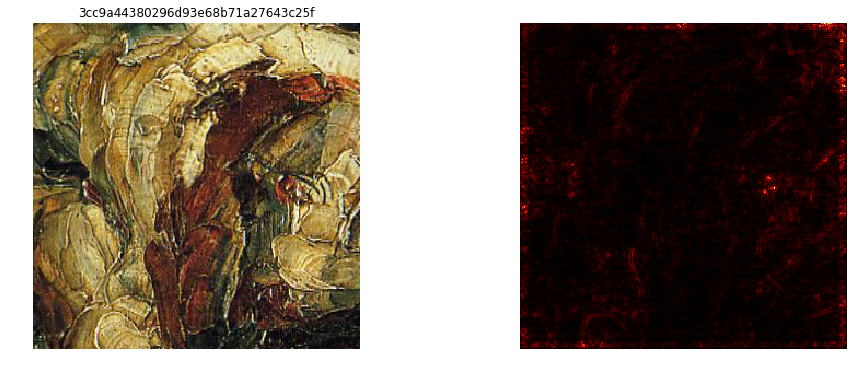

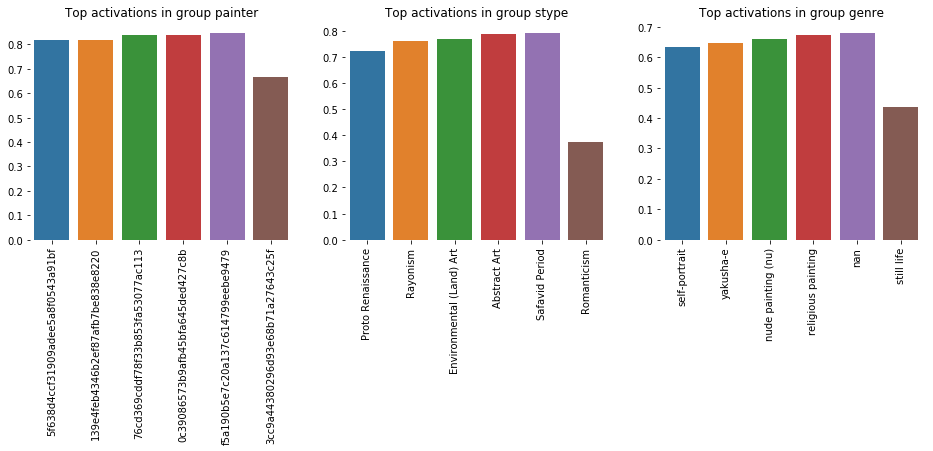

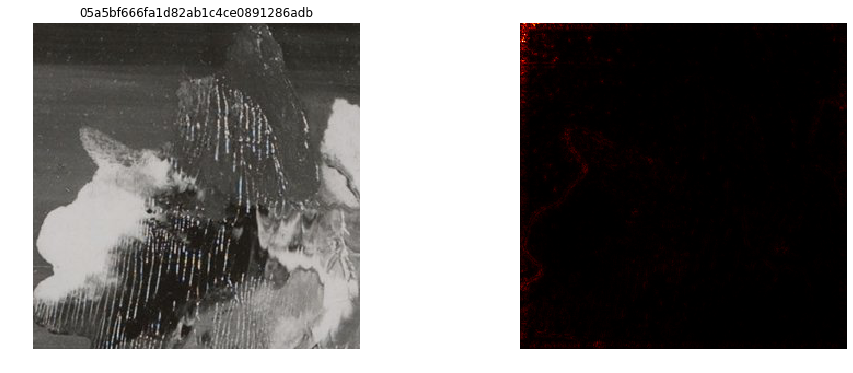

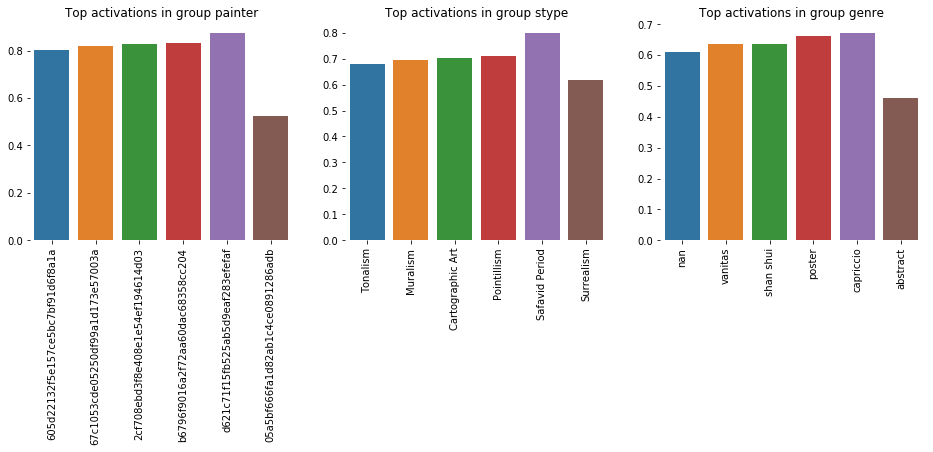

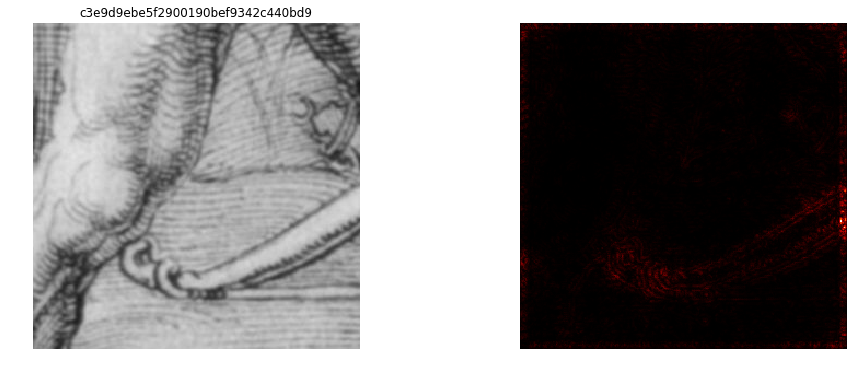

...

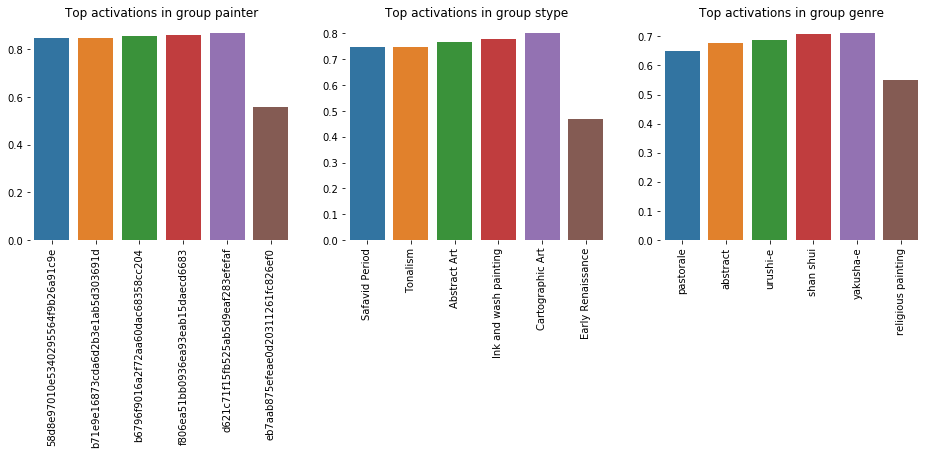

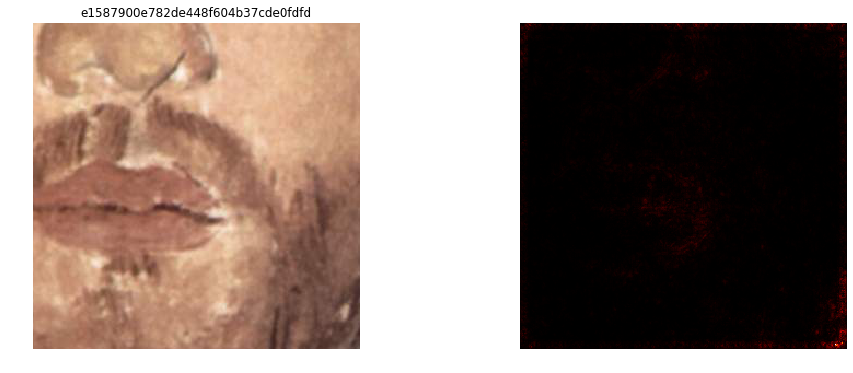

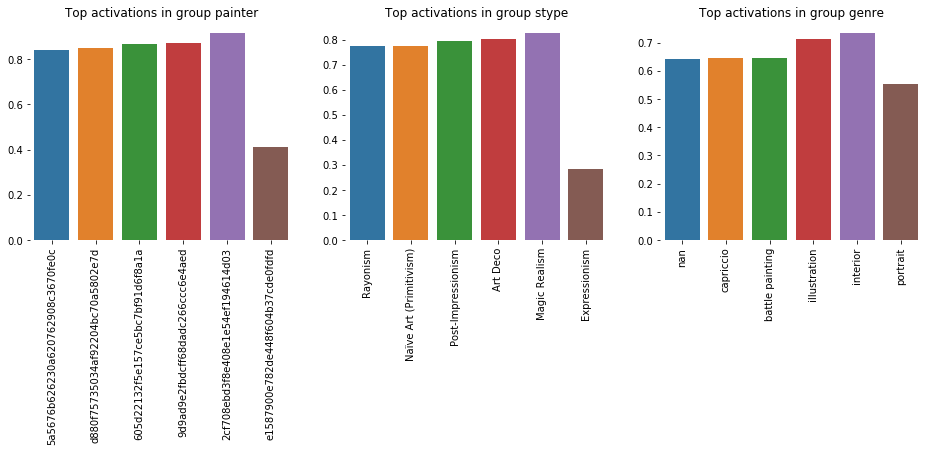

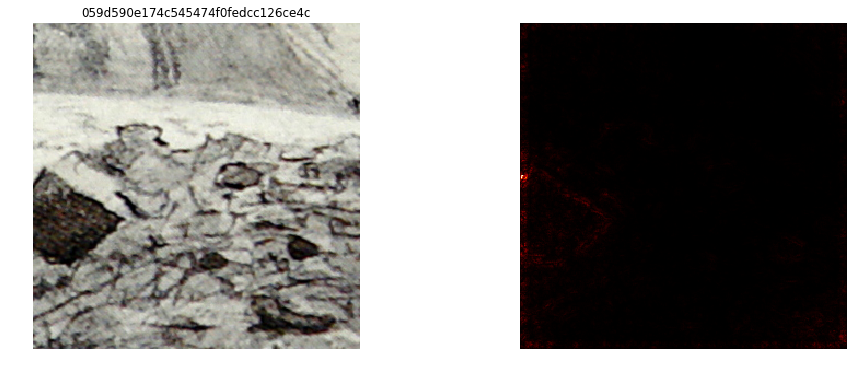

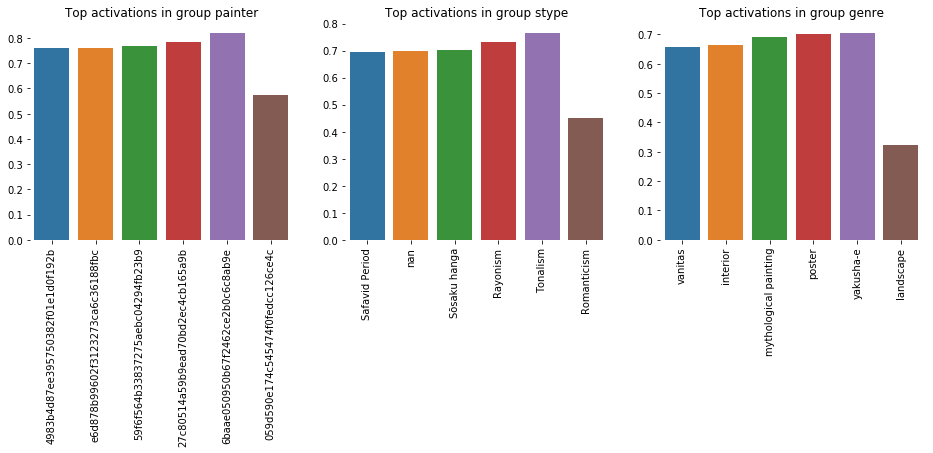

In [95]:
np.random.seed(42)

paintings = np.random.randint(len(train_data), size=[12])

for ix in paintings:
    analyze(file=os.path.join(data_dir, 'train', train_data.filenames[ix]),
            y=train_data.classes[ix],
            k=k,
            enc=encoders[0])

p.shape: (1584,)
p.shape: (1584,)
p.shape: (1584,)
p.shape: (1584,)
p.shape: (1584,)
p.shape: (1584,)
p.shape: (1584,)
p.shape: (1584,)
p.shape: (1584,)
p.shape: (1584,)
p.shape: (1584,)
p.shape: (1584,)


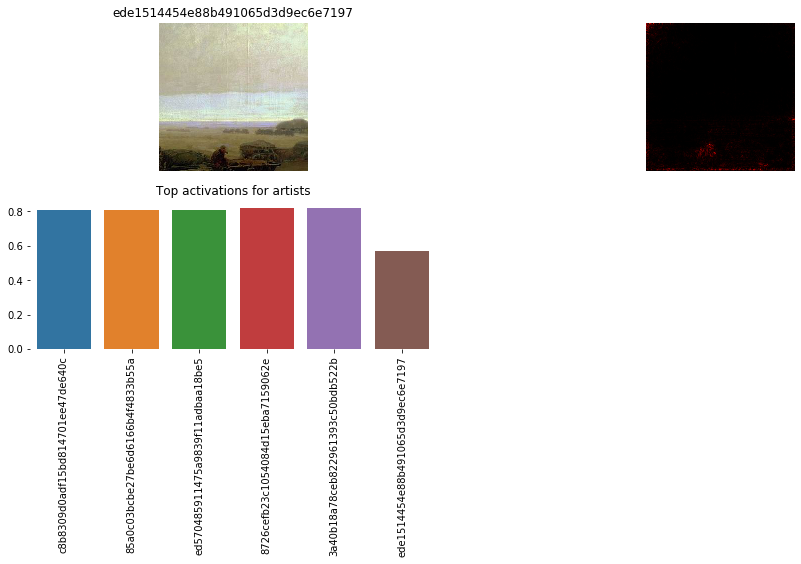

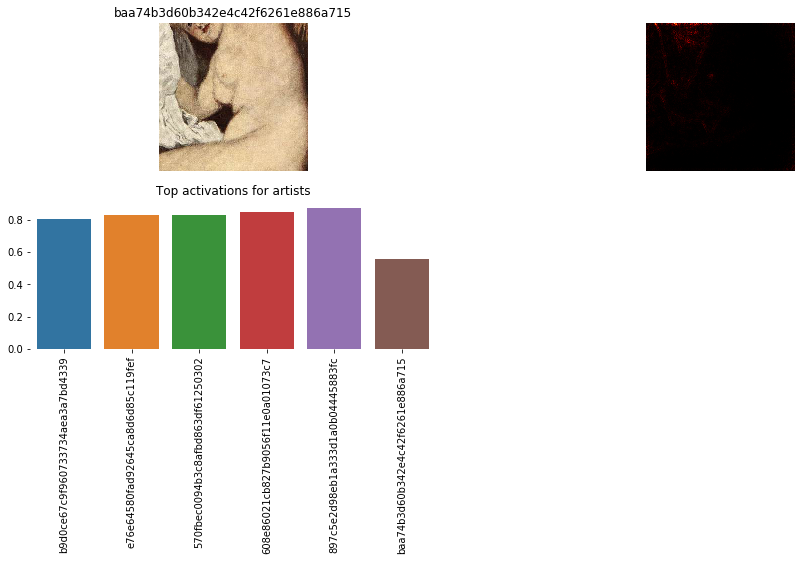

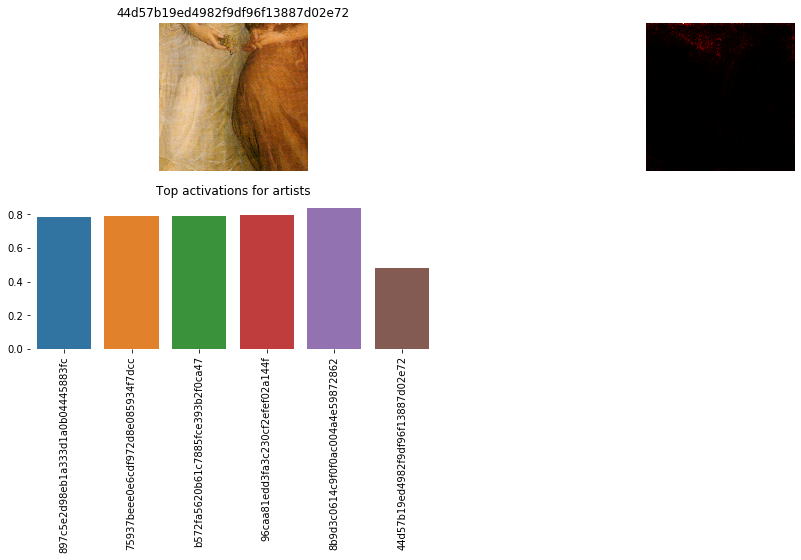

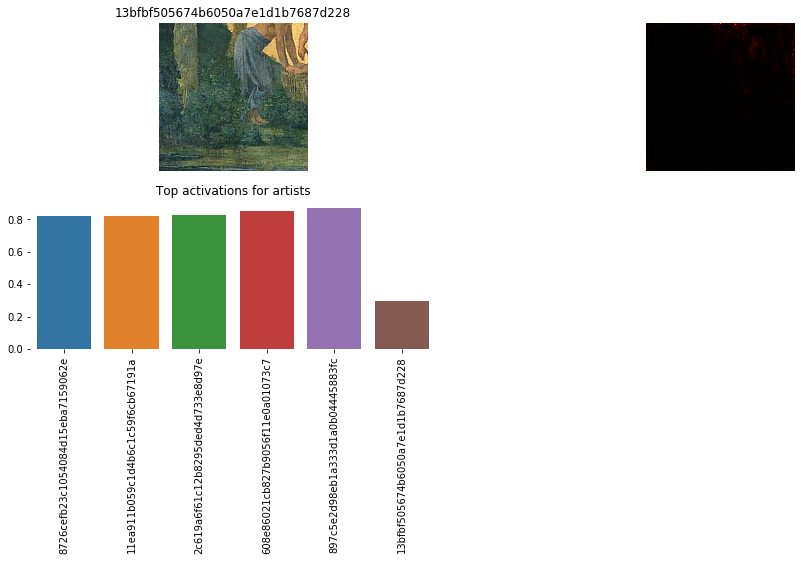

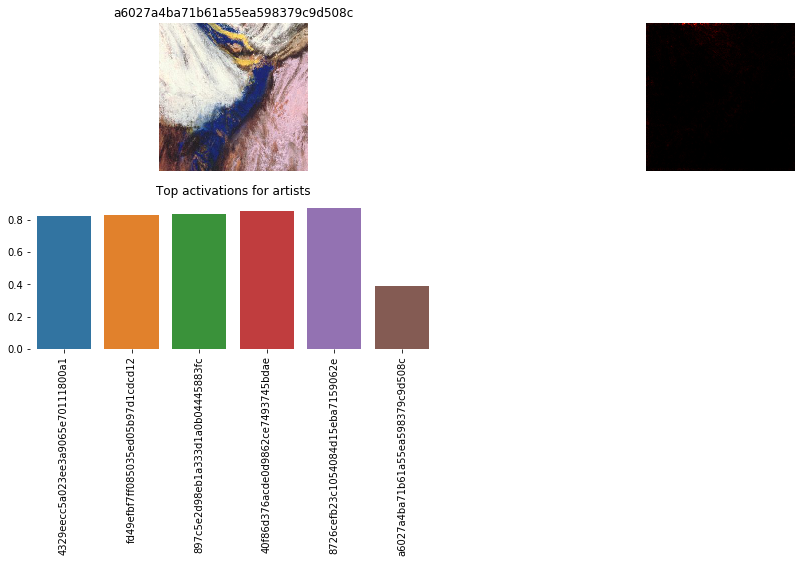

...

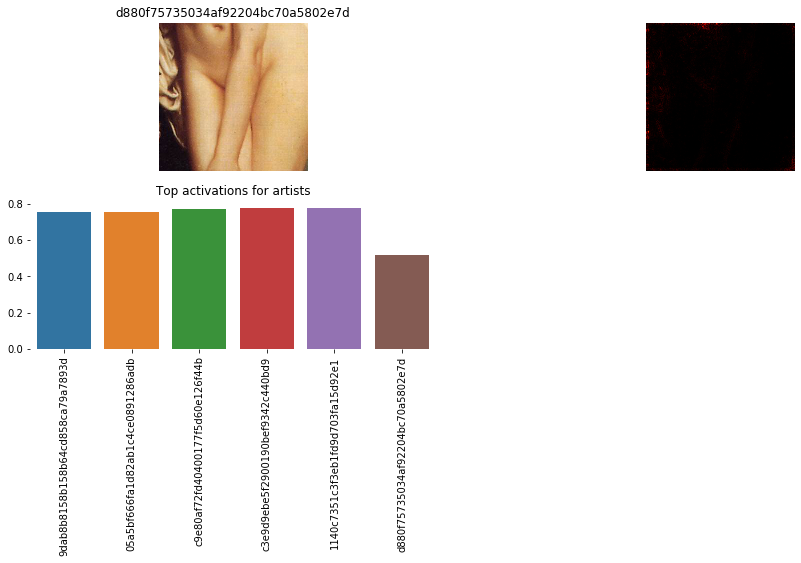

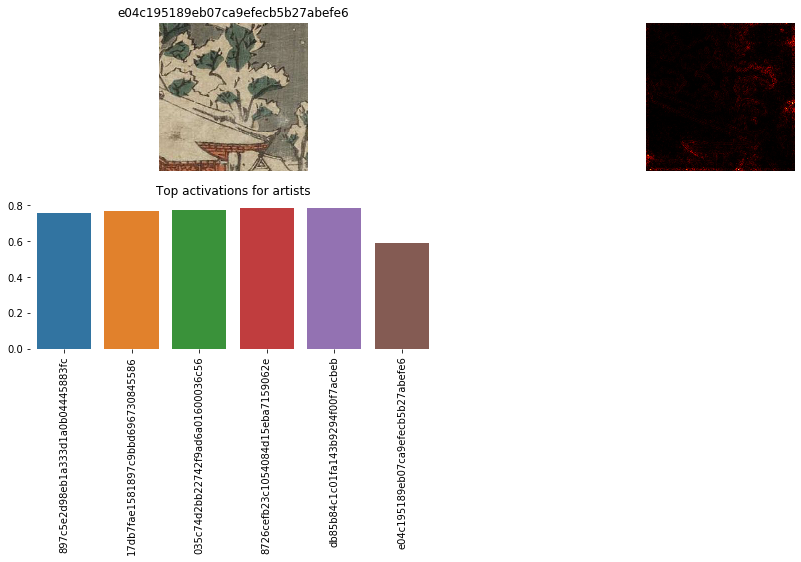

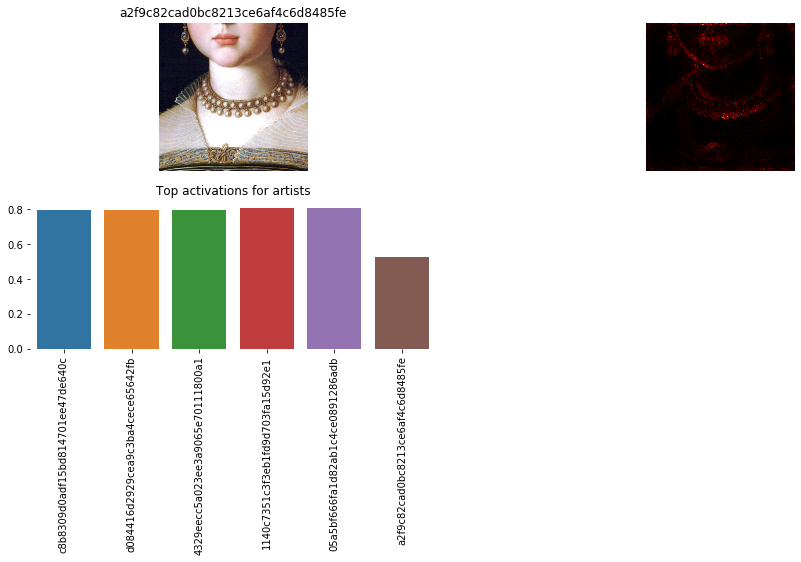

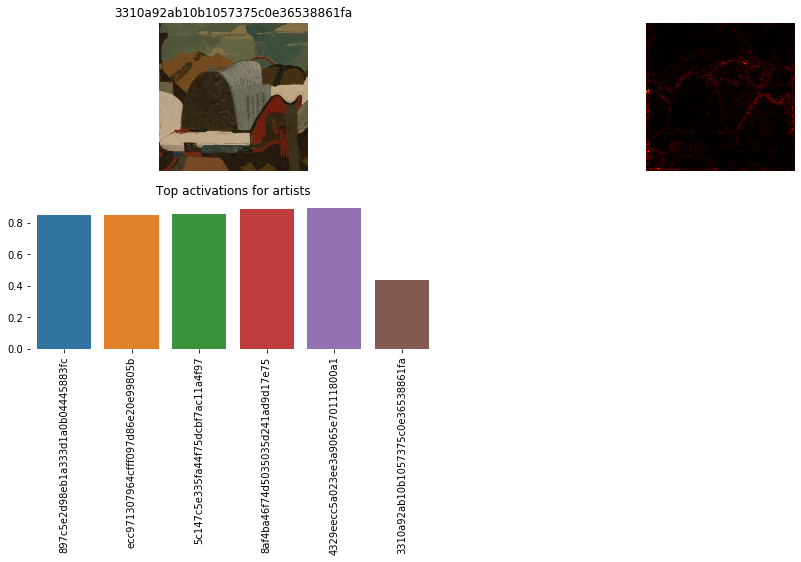

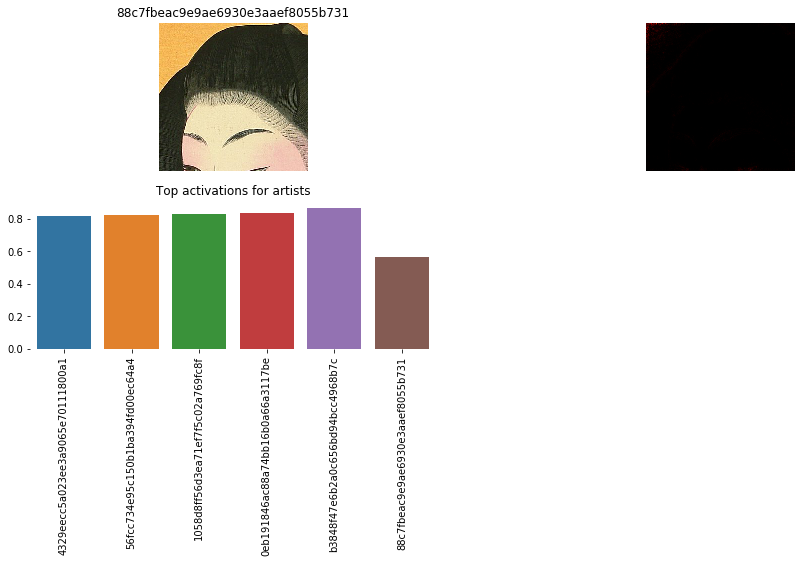

In [34]:
np.random.seed(104129)

paintings = np.random.randint(len(train_data), size=[12])
predictions = []

for ix in paintings:
    r = analyze(file=os.path.join(data_dir, 'train', train_data.filenames[ix]),
                y=train_data.classes[ix],
                multilabel=True,
                enc=encoders[0],
                k=k)
    predictions.append(r)

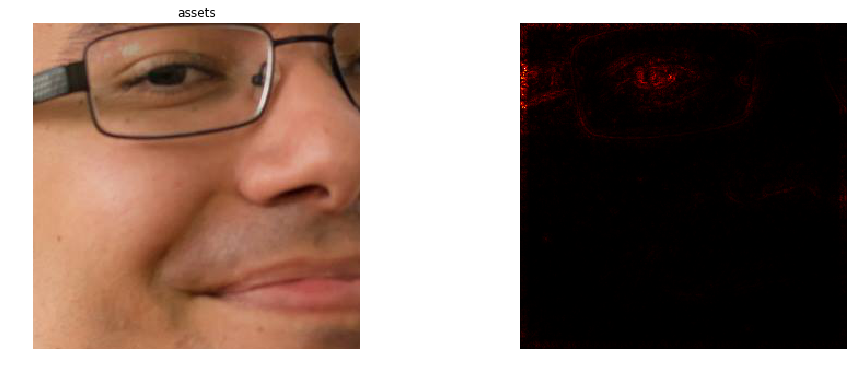

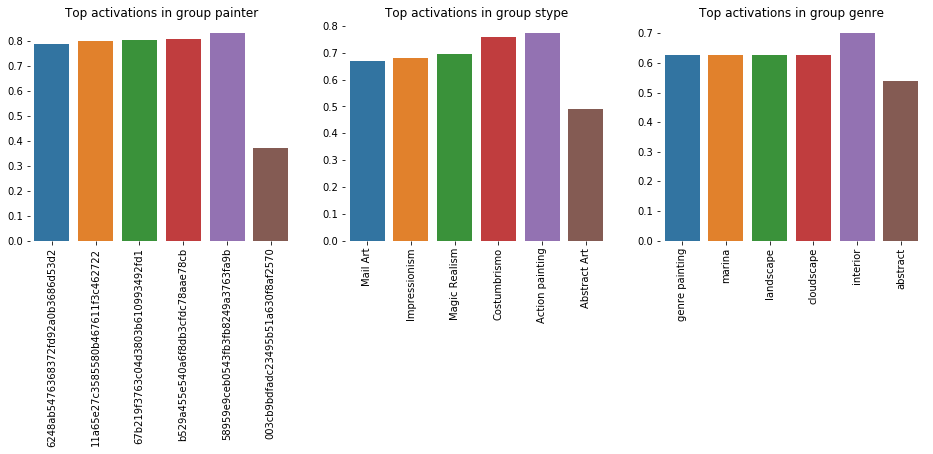

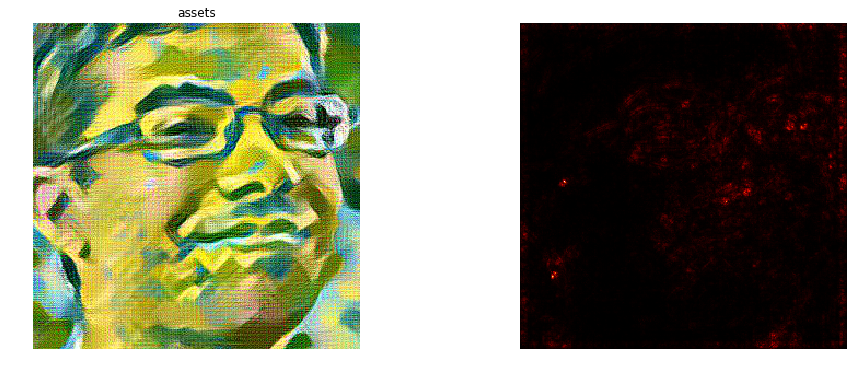

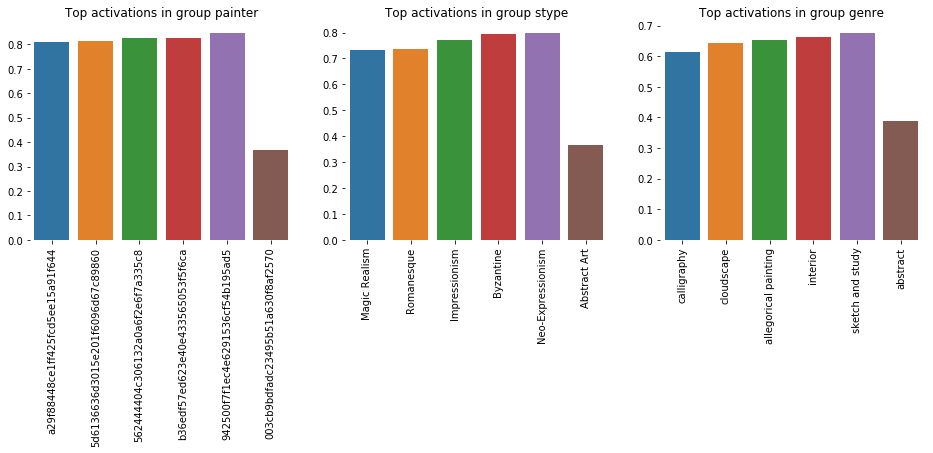

In [9]:
analyze('../assets/rafael-original.jpg')
analyze('../assets/rafael-4-caffenet-content-1e4-512.jpg')

### Multiple Outputs Model Analysis

In [5]:
outputs_meta = [
    {'n': 'artist', 'u': 1584, 'a': 'softmax'},
    {'n': 'style', 'u': 135, 'a': 'softmax'},
    {'n': 'genre', 'u': 42, 'a': 'softmax'},
    {'n': 'date', 'u': 1, 'a': 'linear'}
]
resuming_from = '/mnt/files/work/painter-by-numbers/ckpt/pbn_inception_mo.hdf5'

In [6]:
with tf.device(device):
    model = build_model(image_shape, architecture=architecture,
                        weights=weights,
                        last_base_layer=last_base_layer,
                        use_gram_matrix=use_gram_matrix, pooling=pooling,
                        include_top=True,
                        classes=[o['u'] for o in outputs_meta],
                        predictions_name=[o['n'] for o in outputs_meta],
                        predictions_activation=[o['a'] for o in outputs_meta])

if resuming_from:
    print('re-loading weights...')
    model.load_weights(resuming_from, by_name=True)

model summary: InceptionV3 
  -> dense(1584, activation=softmax, name=artist)
  -> dense(135, activation=softmax, name=style)
  -> dense(42, activation=softmax, name=genre)
  -> dense(1, activation=linear, name=date)
re-loading weights...


In [8]:
model.summary()
layer_idx = utils.find_layer_idx(model, 'artist')

# I don't need this on this model.
model.layers[layer_idx].activation = activations.linear
model = utils.apply_modifications(model)

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 149, 149, 32) 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 149, 149, 32) 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

analyzing 121fffad1eb6f7dff228b8a71b6aec72/2699.jpg
analyzing c14fce5bfd9bf9224facc6b76fc36138/29953.jpg
analyzing d47d74303755d4481b407700fa063abb/4218.jpg
analyzing 8e9d1d01c1a6615a3b71ce6b963a5b1b/1049.jpg
analyzing e33fee698d813c2a474da5d3db0ec538/91492.jpg
analyzing 876ba31e1730d722b176ac6e3bccd569/59538.jpg
analyzing c6bcb5cdd84389d2e8ea6e9abba253c1/32047.jpg
analyzing 7b7281af91e92021dcf5f5a67259416a/32255.jpg
analyzing 83e9823eb4868ca162fd3b7adff70096/47545.jpg
analyzing 31dbc08b8d0a3196c5484c0c068b2bcc/45141.jpg
analyzing c8041306a183cbaf39ff8cd707c9cc7f/70957.jpg
analyzing 349493c7240669fdf037e3d2c2fcd9a9/53537.jpg


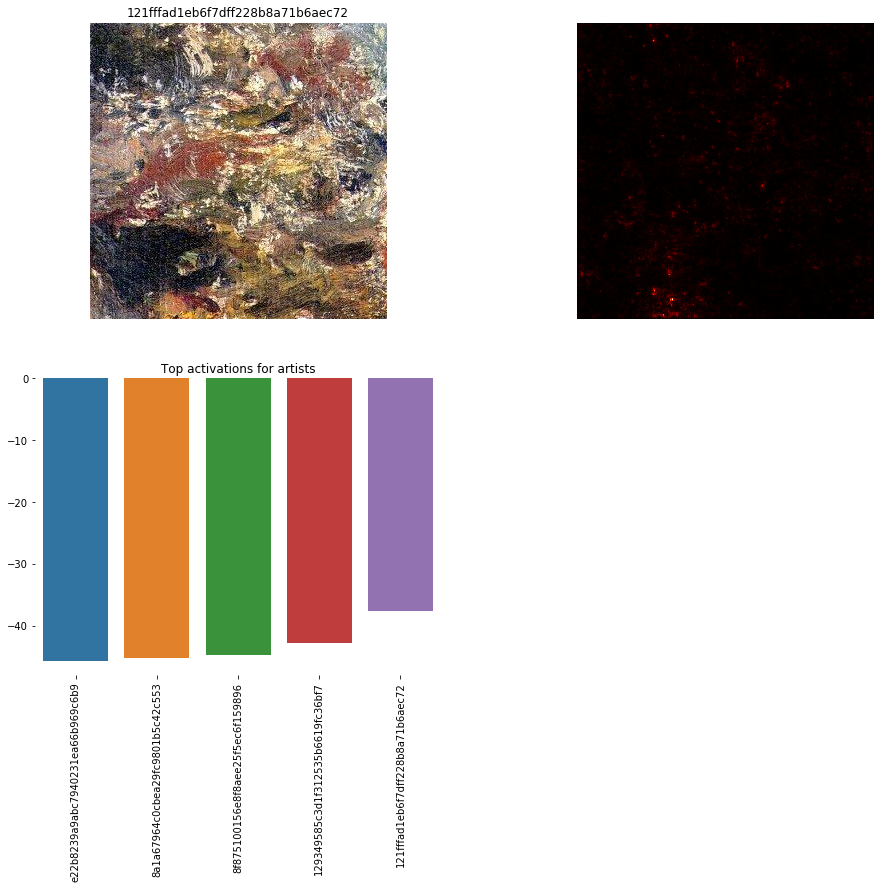

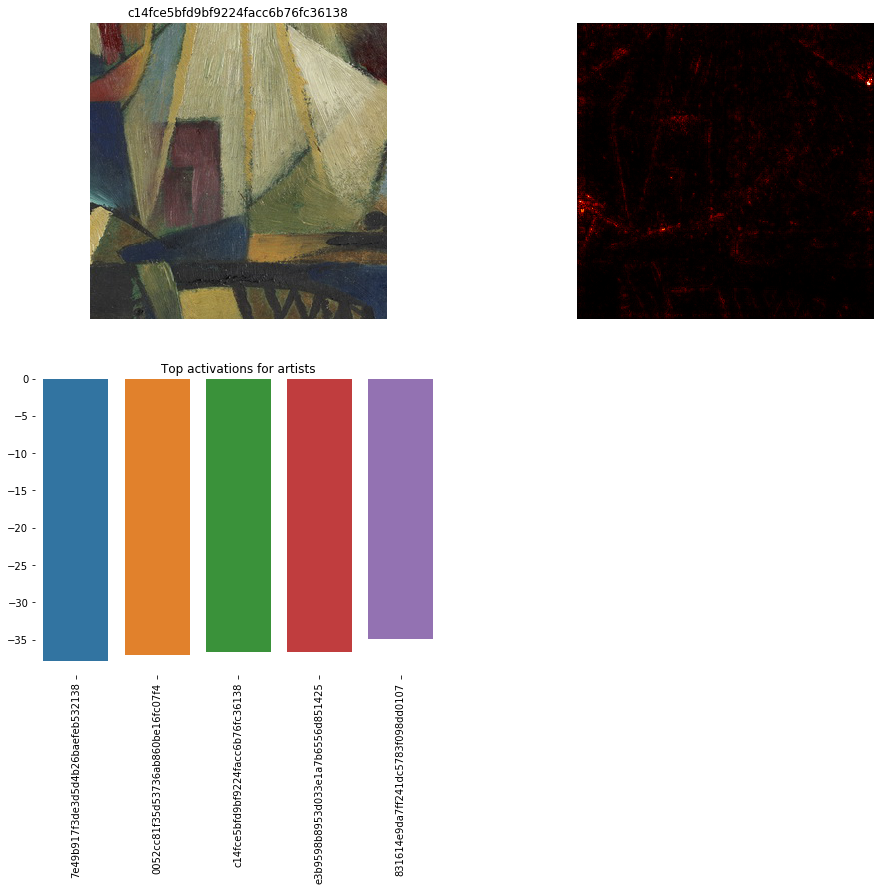

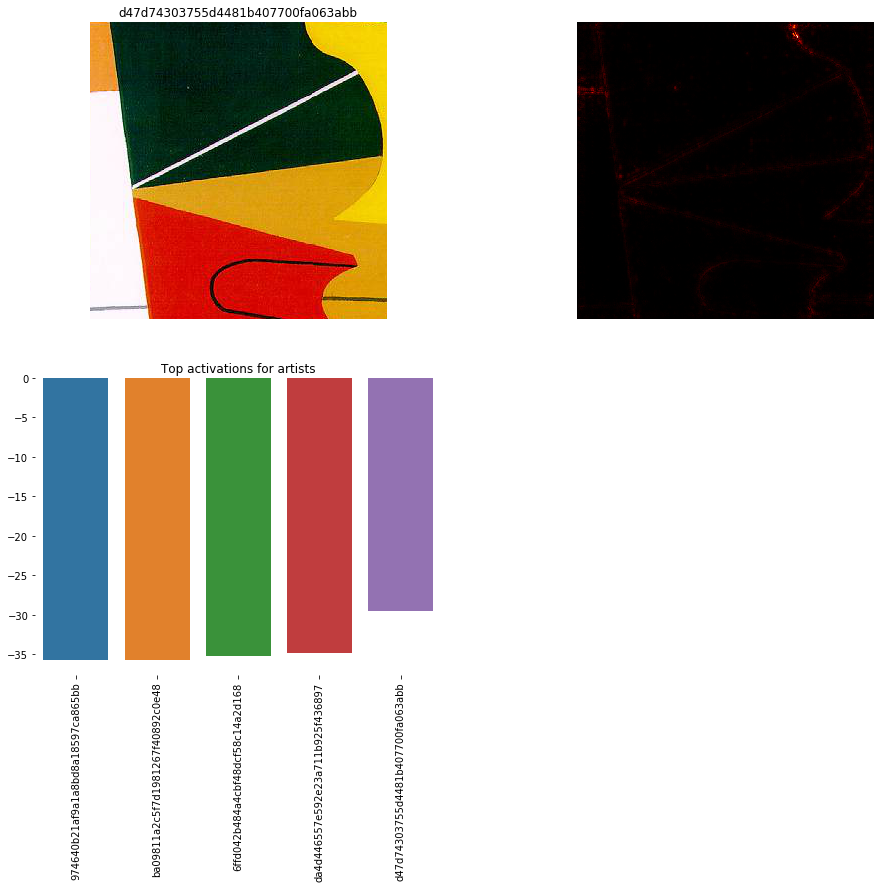

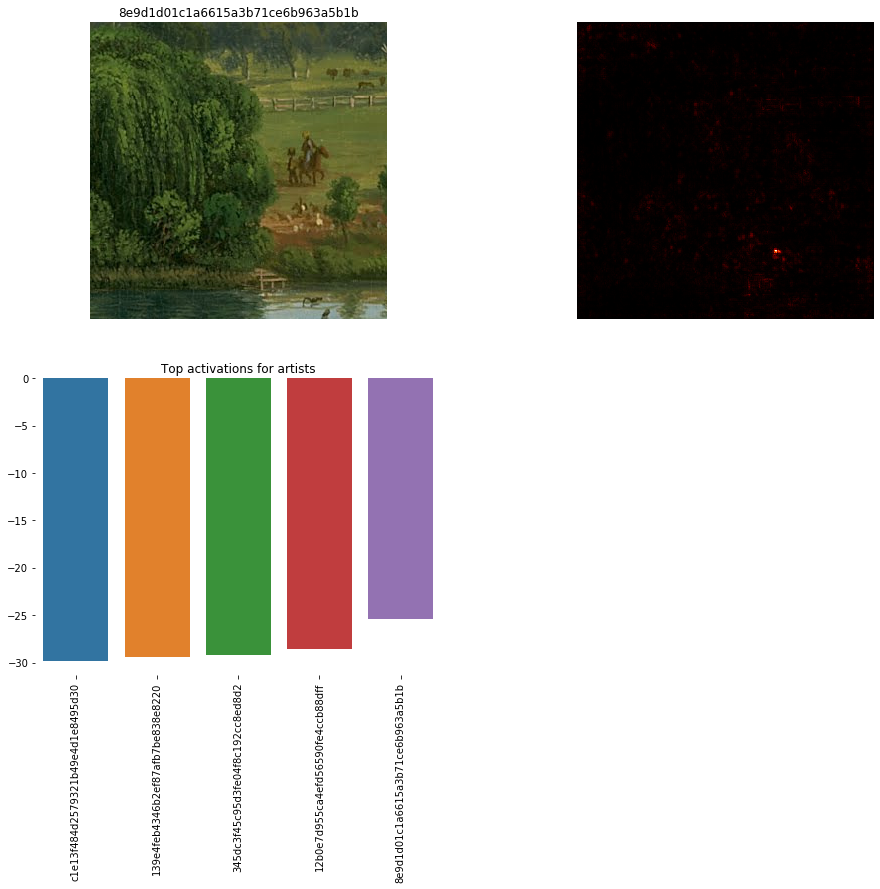

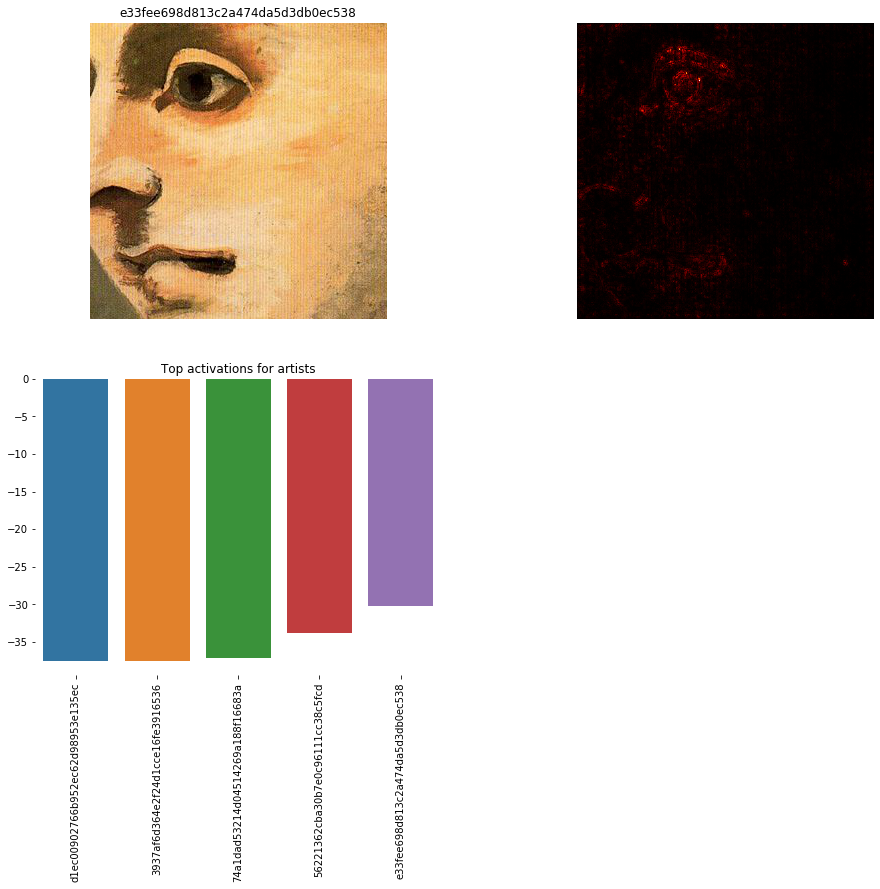

...

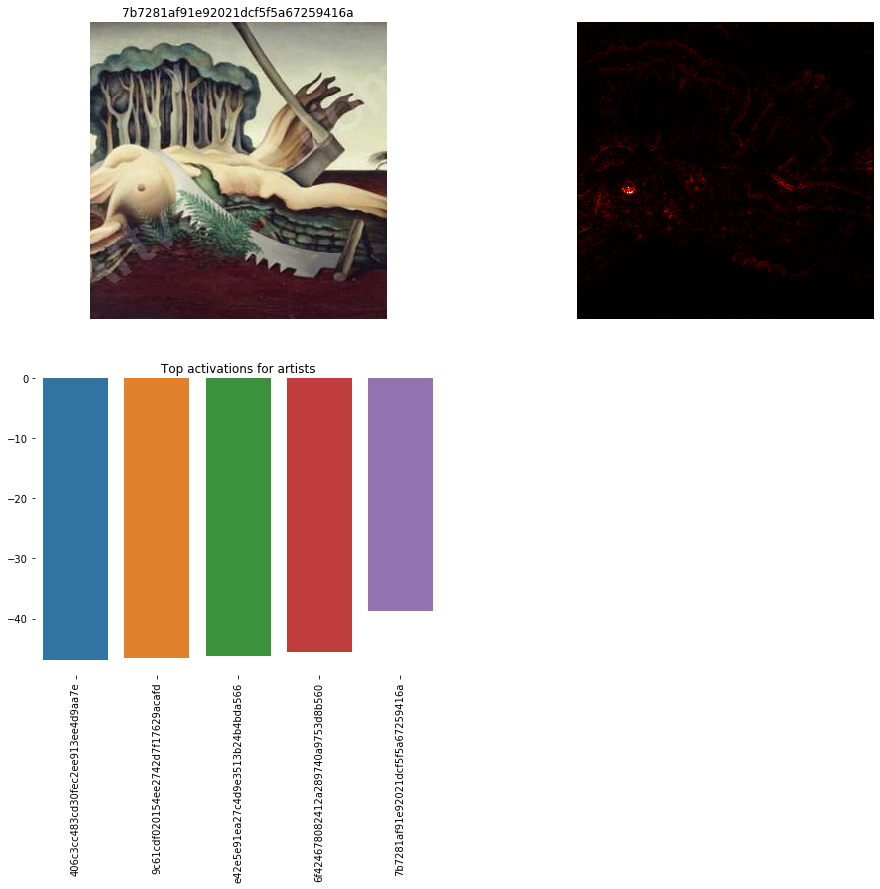

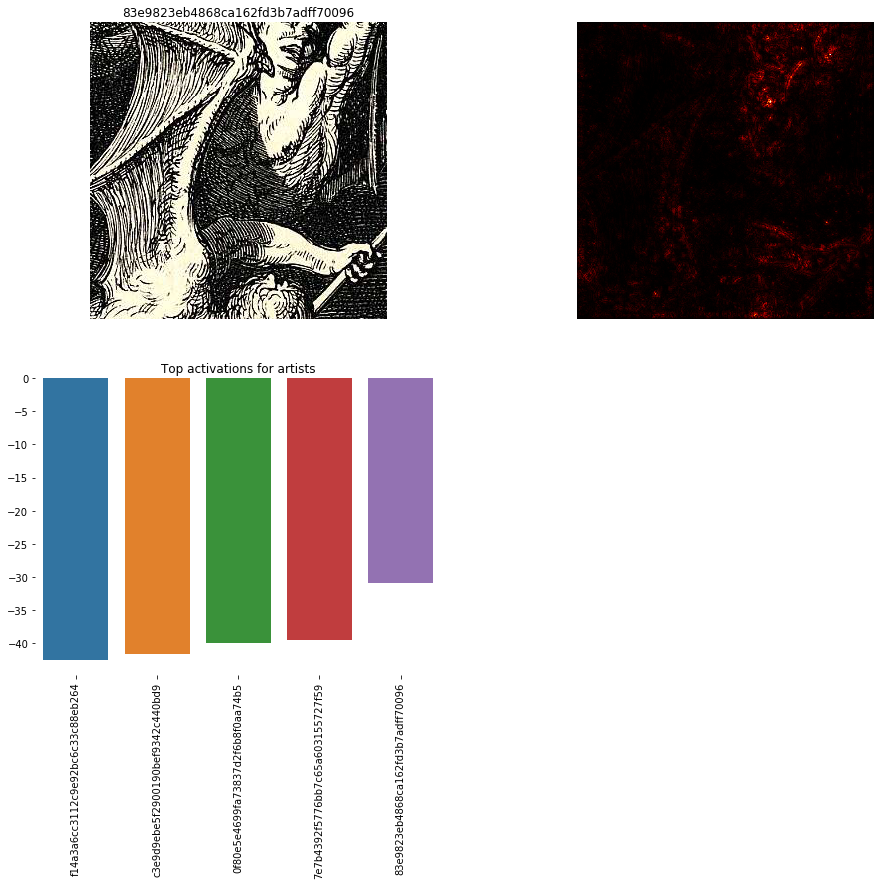

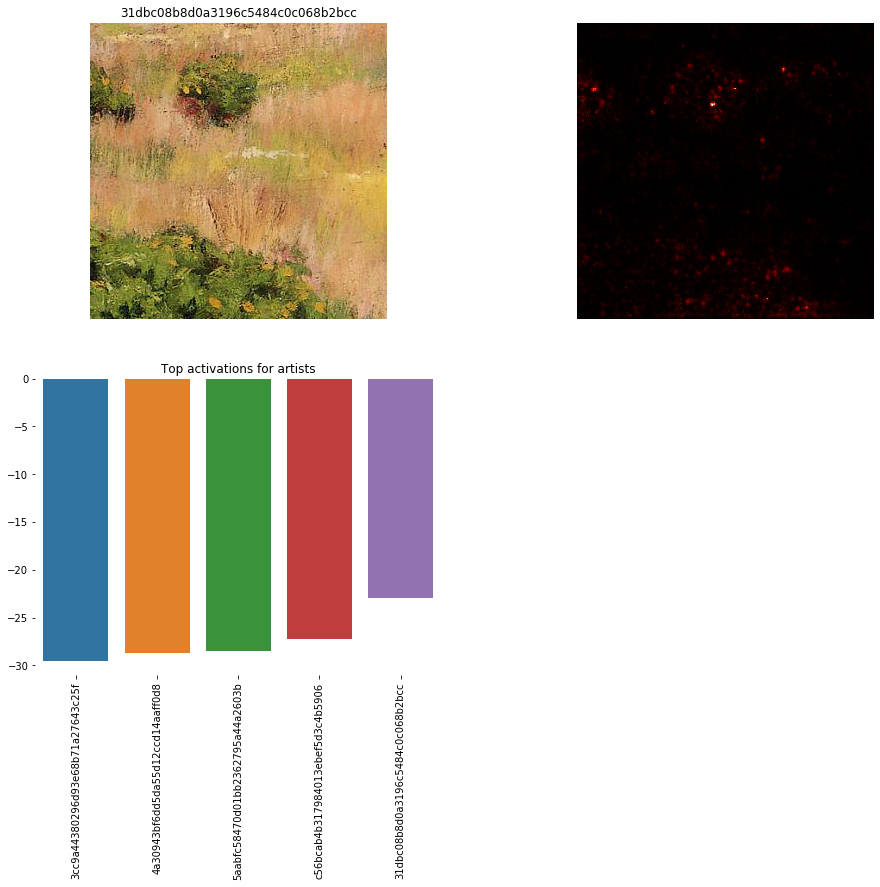

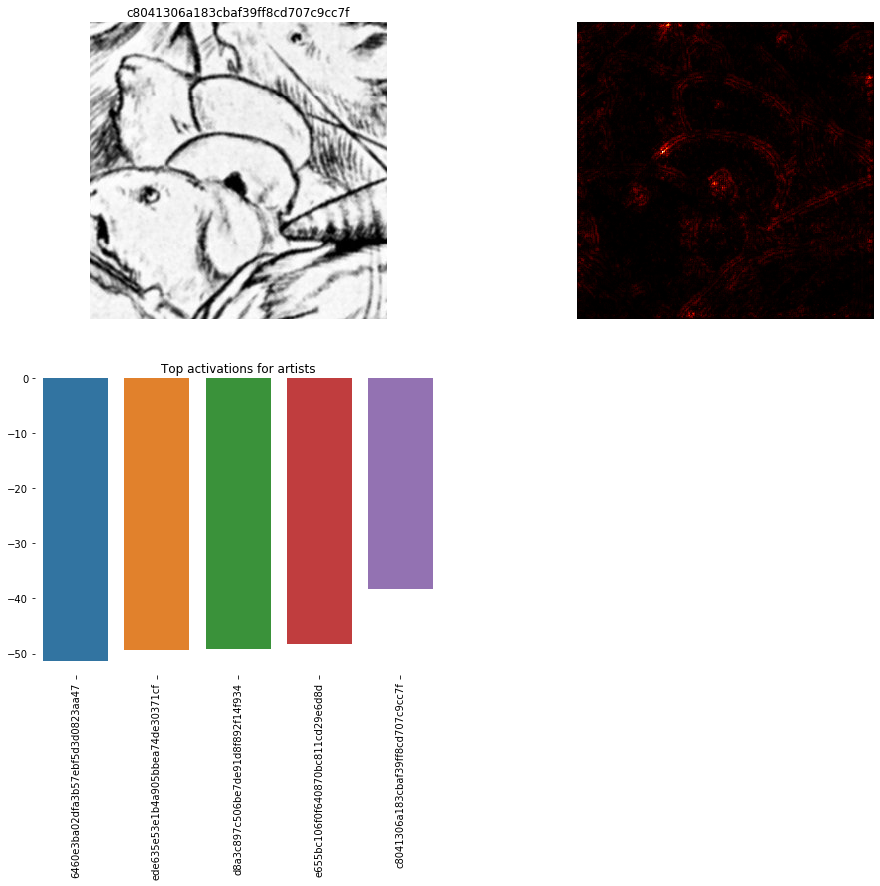

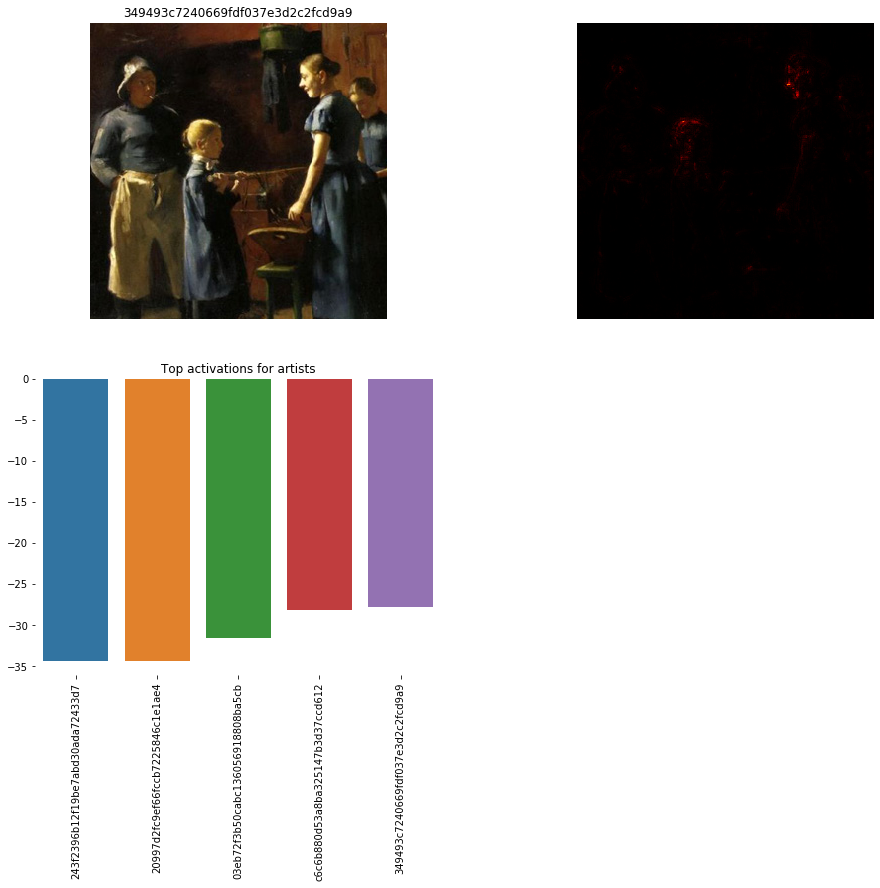

In [28]:
# np.random.seed(11513)
np.random.seed(57199)

paintings = np.random.randint(len(train_data), size=[12])

for ix in paintings:
    print('analyzing', train_data.filenames[ix])
    analyze(file=os.path.join(data_dir, 'train', train_data.filenames[ix]),
            y=train_data.classes[ix],
            k=k,
            enc=encoders[0])